In [1]:
# Install required packages for this notebook
import sys
print("Python executable:", sys.executable)
# Use the notebook's Python to ensure we install into the right environment
!{sys.executable} -m pip install --upgrade pip
!{sys.executable} -m pip install torchview graphviz einops


Python executable: c:\Users\divl212\anaconda3\python.exe


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

# Visualization tools
import matplotlib.pyplot as plt
from torchview import draw_graph
import graphviz
from IPython.display import Image

# data loader

In [ ]:
import os
from PIL import Image
from torchvision import datasets, transforms
from torch.utils.data import Dataset
import torchvision


def load_MNIST(data_transform, train=True):
    return torchvision.datasets.MNIST(
        "./data/",
        download=True,
        train=train,
        transform=data_transform,
    )

def load_transformed_MNIST(img_size, batch_size):
    data_transforms = [
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),  # Scales data into [0,1]
    ]

    data_transform = transforms.Compose(data_transforms)
    train_set = load_MNIST(data_transform, train=True)
    test_set = load_MNIST(data_transform, train=False)
    data = torch.utils.data.ConcatDataset([train_set, test_set])
    dataloader = DataLoader(data, batch_size=batch_size, shuffle=True, drop_last=True)
    return data, dataloader

In [4]:
IMG_SIZE = 28
IMG_CH = 1
BATCH_SIZE = 128
N_CLASSES = 10
data, dataloader = load_transformed_MNIST(IMG_SIZE, BATCH_SIZE)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# model

In [5]:
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: torch.minimum(torch.tensor([1]), t)),
        transforms.Lambda(lambda t: torch.maximum(torch.tensor([0]), t)),
        transforms.ToPILImage(),
    ])
    plt.imshow(reverse_transforms(image[0].detach().cpu()))

In [35]:
class DDPM:
    def __init__(self, B, device):
        self.B = B
        self.T = len(B)
        self.device = device

        # Forward diffusion variables
        self.a = 1.0 - self.B
        self.a_bar = torch.cumprod(self.a, dim=0)
        self.sqrt_a_bar = torch.sqrt(self.a_bar)  # Mean Coefficient
        self.sqrt_one_minus_a_bar = torch.sqrt(1 - self.a_bar)  # St. Dev. Coefficient

        # Reverse diffusion variables
        self.sqrt_a_inv = torch.sqrt(1 / self.a)
        self.pred_noise_coeff = (1 - self.a) / torch.sqrt(1 - self.a_bar)

    def q(self, x_0, t):
        """
        The forward diffusion process
        Returns the noise applied to an image at timestep t
        x_0: the original image
        t: timestep
        """
        t = t.int()
        noise = torch.randn_like(x_0)
        sqrt_a_bar_t = self.sqrt_a_bar[t, None, None, None]
        sqrt_one_minus_a_bar_t = self.sqrt_one_minus_a_bar[t, None, None, None]

        x_t = sqrt_a_bar_t * x_0 + sqrt_one_minus_a_bar_t * noise
        return x_t, noise

    def get_loss(self, model, x_0, t, *model_args):
        x_noisy, noise = self.q(x_0, t)
        noise_pred = model(x_noisy, t, *model_args)
        return F.mse_loss(noise, noise_pred)

    @torch.no_grad()
    def reverse_q(self, x_t, t, e_t):
        """
        The reverse diffusion process
        Returns the an image with the noise from time t removed and time t-1 added.
        model: the model used to remove the noise
        x_t: the noisy image at time t
        t: timestep
        model_args: additional arguments to pass to the model
        """
        t = t.int()
        pred_noise_coeff_t = self.pred_noise_coeff[t]
        sqrt_a_inv_t = self.sqrt_a_inv[t]
        u_t = sqrt_a_inv_t * (x_t - pred_noise_coeff_t * e_t)
        if t[0] == 0:  # All t values should be the same
            return u_t  # Reverse diffusion complete!
        else:
            B_t = self.B[t - 1]  # Apply noise from the previos timestep
            new_noise = torch.randn_like(x_t)
            return u_t + torch.sqrt(B_t) * new_noise

    @torch.no_grad()
    def sample_images(self, model, img_ch, img_size, ncols, *model_args, axis_on=False):
        # Noise to generate images from
        x_t = torch.randn((1, img_ch, img_size, img_size), device=self.device)
        plt.figure(figsize=(10, 10))
        hidden_rows = self.T / ncols
        plot_number = 1

        # Go from T to 0 removing and adding noise until t = 0
        for i in range(0, self.T)[::-1]:
            t = torch.full((1,), i, device=self.device).float()
            e_t = model(x_t, t, *model_args)  # Predicted noise
            x_t = self.reverse_q(x_t, t, e_t)
            if i % hidden_rows == 0:
                ax = plt.subplot(1, ncols+1, plot_number)
                if not axis_on:
                    ax.axis('off')
                show_tensor_image(x_t.detach().cpu())
                plot_number += 1
        plt.show()

In [7]:
nrows = 10
ncols = 15

T = nrows * ncols
B_start = 0.0001
B_end = 0.02
B = torch.linspace(B_start, B_end, T).to(device)
ddpm = DDPM(B, device)

In [8]:
class GELUConvBlock(nn.Module):
    def __init__(
        self, in_ch, out_ch, group_size):
        super().__init__()
        layers = [
            nn.Conv2d(in_ch, out_ch, 3, 1, 1),
            nn.GroupNorm(group_size, out_ch),
            nn.GELU()
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

In [9]:
from einops.layers.torch import Rearrange

rearrange = Rearrange("b c (h p1) (w p2) -> b (c p1 p2) h w", p1=2, p2=2)

test_image = [
    [
        [
            [1, 2, 3, 4, 5, 6],
            [7, 8, 9, 10, 11, 12],
            [13, 14, 15, 16, 17, 18],
            [19, 20, 21, 22, 23, 24],
            [25, 26, 27, 28, 29, 30],
            [31, 32, 33, 34, 35, 36],
        ]
    ]
]
test_image = torch.tensor(test_image)
print(test_image)
output = rearrange(test_image)
output

tensor([[[[ 1,  2,  3,  4,  5,  6],
          [ 7,  8,  9, 10, 11, 12],
          [13, 14, 15, 16, 17, 18],
          [19, 20, 21, 22, 23, 24],
          [25, 26, 27, 28, 29, 30],
          [31, 32, 33, 34, 35, 36]]]])


tensor([[[[ 1,  3,  5],
          [13, 15, 17],
          [25, 27, 29]],

         [[ 2,  4,  6],
          [14, 16, 18],
          [26, 28, 30]],

         [[ 7,  9, 11],
          [19, 21, 23],
          [31, 33, 35]],

         [[ 8, 10, 12],
          [20, 22, 24],
          [32, 34, 36]]]])

In [10]:
class RearrangePoolBlock(nn.Module):
    def __init__(self, in_chs, group_size):
        super().__init__()
        self.rearrange = Rearrange("b c (h p1) (w p2) -> b (c p1 p2) h w", p1=2, p2=2)
        self.conv = GELUConvBlock(4 * in_chs, in_chs, group_size)

    def forward(self, x):
        x = self.rearrange(x)
        return self.conv(x)

In [11]:
class DownBlock(nn.Module):
    def __init__(self, in_chs, out_chs, group_size):
        super(DownBlock, self).__init__()
        layers = [
            GELUConvBlock(in_chs, out_chs, group_size),
            GELUConvBlock(out_chs, out_chs, group_size),
            RearrangePoolBlock(out_chs, group_size)
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

In [12]:
class UpBlock(nn.Module):
    def __init__(self, in_chs, out_chs, group_size):
        super(UpBlock, self).__init__()
        layers = [
            nn.ConvTranspose2d(2 * in_chs, out_chs, 2, 2),
            GELUConvBlock(out_chs, out_chs, group_size),
            GELUConvBlock(out_chs, out_chs, group_size),
            GELUConvBlock(out_chs, out_chs, group_size),
            GELUConvBlock(out_chs, out_chs, group_size),
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x, skip):
        x = torch.cat((x, skip), 1)
        x = self.model(x)
        return x

In [13]:
import math

class SinusoidalPositionEmbedBlock(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings

In [14]:
class EmbedBlock(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedBlock, self).__init__()
        self.input_dim = input_dim
        layers = [
            nn.Linear(input_dim, emb_dim),
            nn.GELU(),
            nn.Linear(emb_dim, emb_dim),
            nn.Unflatten(1, (emb_dim, 1, 1))
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = x.view(-1, self.input_dim)
        return self.model(x)

In [15]:
class ResidualConvBlock(nn.Module):
    def __init__(self, in_chs, out_chs, group_size):
        super().__init__()
        self.conv1 = GELUConvBlock(in_chs, out_chs, group_size)
        self.conv2 = GELUConvBlock(out_chs, out_chs, group_size)

    def forward(self, x):
        x1 = self.conv1(x)
        x2 = self.conv2(x1)
        out = x1 + x2
        return out

In [16]:
class UNet(nn.Module):
    def __init__(
        self, T, img_ch, img_size, down_chs=(64, 64, 128), t_embed_dim=8, c_embed_dim=10
    ):
        super().__init__()
        self.T = T
        up_chs = down_chs[::-1]  # Reverse of the down channels
        latent_image_size = img_size // 4  # 2 ** (len(down_chs) - 1)
        small_group_size = 8
        big_group_size = 32

        # Inital convolution
        self.down0 = ResidualConvBlock(img_ch, down_chs[0], small_group_size)

        # Downsample
        self.down1 = DownBlock(down_chs[0], down_chs[1], big_group_size)
        self.down2 = DownBlock(down_chs[1], down_chs[2], big_group_size)
        self.to_vec = nn.Sequential(nn.Flatten(), nn.GELU())

        # Embeddings
        self.dense_emb = nn.Sequential(
            nn.Linear(down_chs[2] * latent_image_size**2, down_chs[1]),
            nn.ReLU(),
            nn.Linear(down_chs[1], down_chs[1]),
            nn.ReLU(),
            nn.Linear(down_chs[1], down_chs[2] * latent_image_size**2),
            nn.ReLU(),
        )
        self.sinusoidaltime = SinusoidalPositionEmbedBlock(t_embed_dim)
        self.t_emb1 = EmbedBlock(t_embed_dim, up_chs[0])
        self.t_emb2 = EmbedBlock(t_embed_dim, up_chs[1])
        self.c_embed1 = EmbedBlock(c_embed_dim, up_chs[0])
        self.c_embed2 = EmbedBlock(c_embed_dim, up_chs[1])

        # Upsample
        self.up0 = nn.Sequential(
            nn.Unflatten(1, (up_chs[0], latent_image_size, latent_image_size)),
            GELUConvBlock(up_chs[0], up_chs[0], big_group_size),
        )
        self.up1 = UpBlock(up_chs[0], up_chs[1], big_group_size)
        self.up2 = UpBlock(up_chs[1], up_chs[2], big_group_size)

        # Match output channels and one last concatenation
        self.out = nn.Sequential(
            nn.Conv2d(2 * up_chs[-1], up_chs[-1], 3, 1, 1),
            nn.GroupNorm(small_group_size, up_chs[-1]),
            nn.ReLU(),
            nn.Conv2d(up_chs[-1], img_ch, 3, 1, 1),
        )

    def forward(self, x, t, c, c_mask):
        down0 = self.down0(x)
        down1 = self.down1(down0)
        down2 = self.down2(down1)
        latent_vec = self.to_vec(down2)

        latent_vec = self.dense_emb(latent_vec)
        t = t.float() / self.T  # Convert from [0, T] to [0, 1]
        t = self.sinusoidaltime(t)
        t_emb1 = self.t_emb1(t)
        t_emb2 = self.t_emb2(t)

        c = c * c_mask
        c_emb1 = self.c_embed1(c)
        c_emb2 = self.c_embed2(c)

        up0 = self.up0(latent_vec)
        up1 = self.up1(c_emb1 * up0 + t_emb1, down2)
        up2 = self.up2(c_emb2 * up1 + t_emb2, down1)
        return self.out(torch.cat((up2, down0), 1))

In [17]:
def get_context_mask(c, drop_prob):
    c_hot = F.one_hot(c.to(torch.int64), num_classes=N_CLASSES).to(device)
    c_mask = torch.bernoulli(torch.ones_like(c_hot).float() - drop_prob).to(device)
    return c_hot, c_mask

# start training

In [18]:
# Cell: 模型初始化部分

model = UNet(
    T, IMG_CH, IMG_SIZE, down_chs=(64, 64, 128), t_embed_dim=8, c_embed_dim=N_CLASSES
)
print("Num params: ", sum(p.numel() for p in model.parameters()))
model = model.to(device)  # 只移到 device，移除 torch.compile()

Num params:  2547457


Epoch 0 | Step 000 | Loss: 1.217039942741394 | C: 0


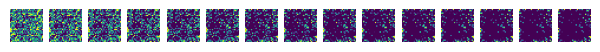

Epoch 0 | Step 100 | Loss: 0.08063890039920807 | C: 1


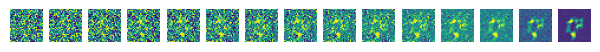

Epoch 0 | Step 200 | Loss: 0.06560756266117096 | C: 2


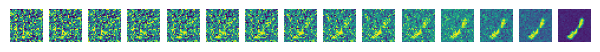

Epoch 0 | Step 300 | Loss: 0.05180147662758827 | C: 3


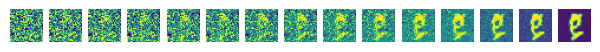

Epoch 0 | Step 400 | Loss: 0.05384187027812004 | C: 4


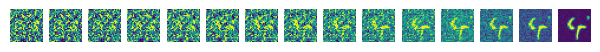

Epoch 0 | Step 500 | Loss: 0.049215372651815414 | C: 5


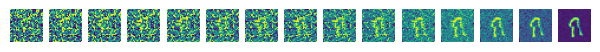

Epoch 1 | Step 000 | Loss: 0.044622376561164856 | C: 6


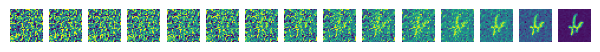

Epoch 1 | Step 100 | Loss: 0.043240878731012344 | C: 7


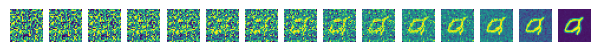

Epoch 1 | Step 200 | Loss: 0.0400155633687973 | C: 8


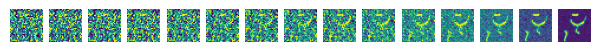

Epoch 1 | Step 300 | Loss: 0.04050638526678085 | C: 9


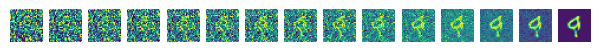

Epoch 1 | Step 400 | Loss: 0.039238959550857544 | C: 0


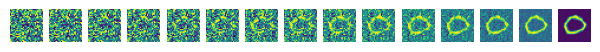

Epoch 1 | Step 500 | Loss: 0.04494400694966316 | C: 1


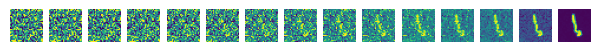

Epoch 2 | Step 000 | Loss: 0.04669826850295067 | C: 2


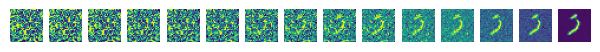

Epoch 2 | Step 100 | Loss: 0.04105643928050995 | C: 3


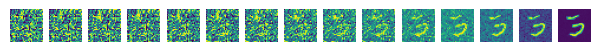

Epoch 2 | Step 200 | Loss: 0.042412351816892624 | C: 4


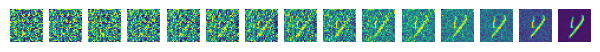

Epoch 2 | Step 300 | Loss: 0.03505914658308029 | C: 5


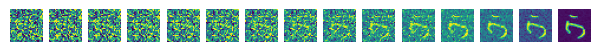

Epoch 2 | Step 400 | Loss: 0.04219788312911987 | C: 6


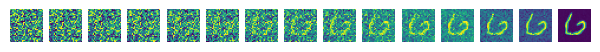

Epoch 2 | Step 500 | Loss: 0.04153339937329292 | C: 7


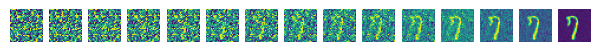

Epoch 3 | Step 000 | Loss: 0.036395564675331116 | C: 8


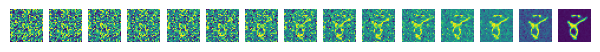

Epoch 3 | Step 100 | Loss: 0.03752917796373367 | C: 9


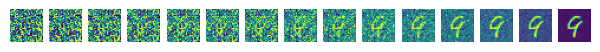

Epoch 3 | Step 200 | Loss: 0.0328328013420105 | C: 0


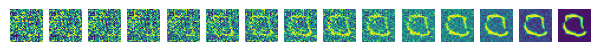

Epoch 3 | Step 300 | Loss: 0.039811838418245316 | C: 1


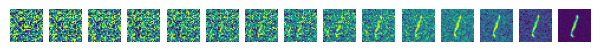

Epoch 3 | Step 400 | Loss: 0.039321087300777435 | C: 2


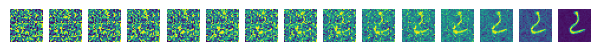

Epoch 3 | Step 500 | Loss: 0.0399513877928257 | C: 3


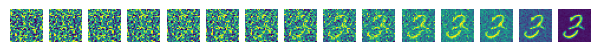

Epoch 4 | Step 000 | Loss: 0.03765435889363289 | C: 4


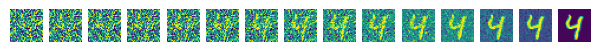

Epoch 4 | Step 100 | Loss: 0.03981700539588928 | C: 5


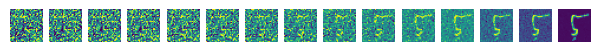

Epoch 4 | Step 200 | Loss: 0.02876339852809906 | C: 6


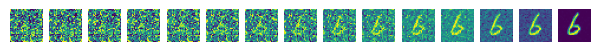

Epoch 4 | Step 300 | Loss: 0.03460535779595375 | C: 7


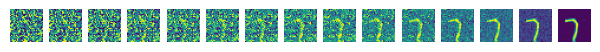

Epoch 4 | Step 400 | Loss: 0.03570724278688431 | C: 8


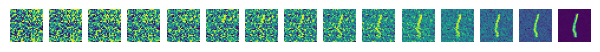

Epoch 4 | Step 500 | Loss: 0.03746313229203224 | C: 9


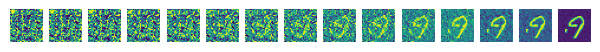

Epoch 5 | Step 000 | Loss: 0.03479565307497978 | C: 0


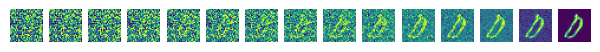

Epoch 5 | Step 100 | Loss: 0.032442014664411545 | C: 1


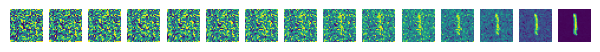

Epoch 5 | Step 200 | Loss: 0.03865348547697067 | C: 2


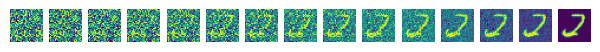

Epoch 5 | Step 300 | Loss: 0.032660044729709625 | C: 3


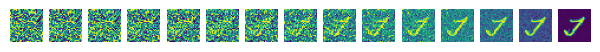

Epoch 5 | Step 400 | Loss: 0.03851717710494995 | C: 4


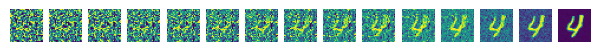

Epoch 5 | Step 500 | Loss: 0.03126619756221771 | C: 5


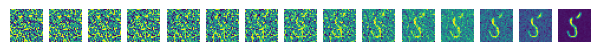

Epoch 6 | Step 000 | Loss: 0.03992600366473198 | C: 6


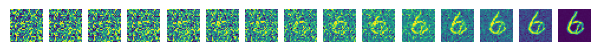

Epoch 6 | Step 100 | Loss: 0.04467296600341797 | C: 7


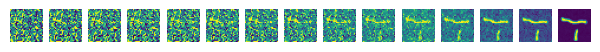

Epoch 6 | Step 200 | Loss: 0.034898001700639725 | C: 8


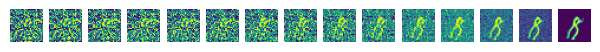

Epoch 6 | Step 300 | Loss: 0.03823446109890938 | C: 9


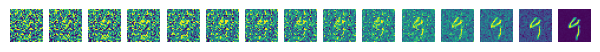

Epoch 6 | Step 400 | Loss: 0.03564209118485451 | C: 0


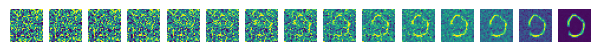

Epoch 6 | Step 500 | Loss: 0.030951565131545067 | C: 1


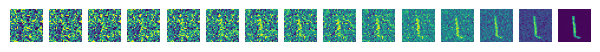

Epoch 7 | Step 000 | Loss: 0.03658108413219452 | C: 2


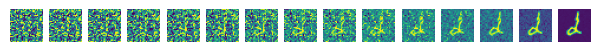

Epoch 7 | Step 100 | Loss: 0.032298095524311066 | C: 3


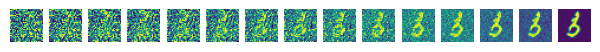

Epoch 7 | Step 200 | Loss: 0.04109121859073639 | C: 4


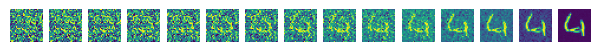

Epoch 7 | Step 300 | Loss: 0.03386417031288147 | C: 5


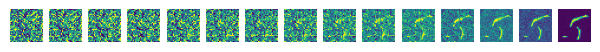

Epoch 7 | Step 400 | Loss: 0.03704795986413956 | C: 6


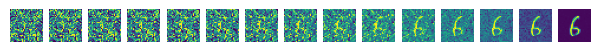

Epoch 7 | Step 500 | Loss: 0.03322405368089676 | C: 7


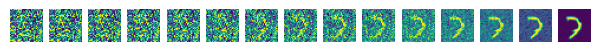

Epoch 8 | Step 000 | Loss: 0.03680259734392166 | C: 8


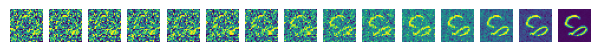

Epoch 8 | Step 100 | Loss: 0.03415442258119583 | C: 9


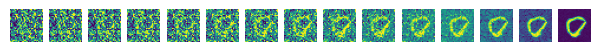

Epoch 8 | Step 200 | Loss: 0.030765695497393608 | C: 0


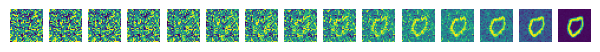

Epoch 8 | Step 300 | Loss: 0.036499205976724625 | C: 1


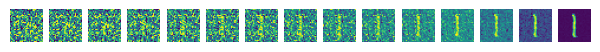

Epoch 8 | Step 400 | Loss: 0.03366222232580185 | C: 2


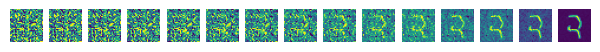

Epoch 8 | Step 500 | Loss: 0.03082522191107273 | C: 3


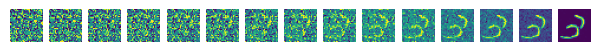

Epoch 9 | Step 000 | Loss: 0.029562974348664284 | C: 4


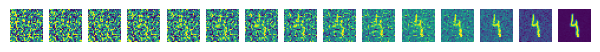

Epoch 9 | Step 100 | Loss: 0.04032992199063301 | C: 5


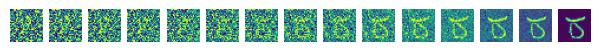

Epoch 9 | Step 200 | Loss: 0.03704317659139633 | C: 6


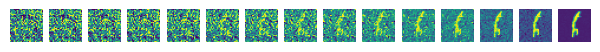

Epoch 9 | Step 300 | Loss: 0.03145909309387207 | C: 7


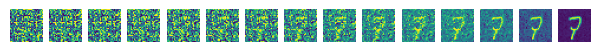

Epoch 9 | Step 400 | Loss: 0.03420209512114525 | C: 8


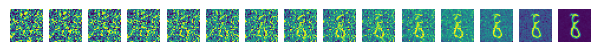

Epoch 9 | Step 500 | Loss: 0.03501557931303978 | C: 9


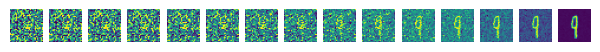

Epoch 10 | Step 000 | Loss: 0.029322253540158272 | C: 0


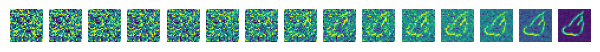

Epoch 10 | Step 100 | Loss: 0.031463053077459335 | C: 1


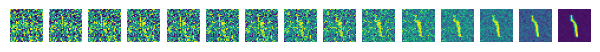

Epoch 10 | Step 200 | Loss: 0.03963671252131462 | C: 2


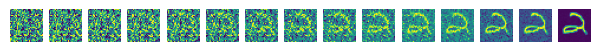

Epoch 10 | Step 300 | Loss: 0.03323217108845711 | C: 3


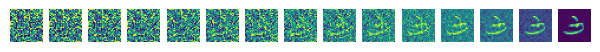

Epoch 10 | Step 400 | Loss: 0.03696448728442192 | C: 4


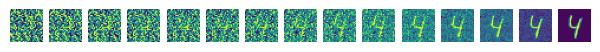

Epoch 10 | Step 500 | Loss: 0.04060087725520134 | C: 5


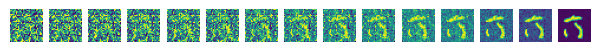

Epoch 11 | Step 000 | Loss: 0.03425886482000351 | C: 6


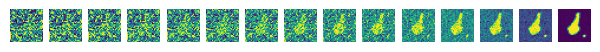

Epoch 11 | Step 100 | Loss: 0.03071153350174427 | C: 7


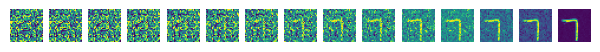

Epoch 11 | Step 200 | Loss: 0.03252851590514183 | C: 8


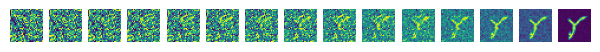

Epoch 11 | Step 300 | Loss: 0.031245410442352295 | C: 9


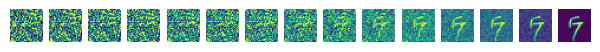

Epoch 11 | Step 400 | Loss: 0.03506525233387947 | C: 0


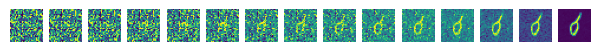

Epoch 11 | Step 500 | Loss: 0.03648846596479416 | C: 1


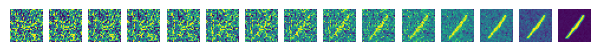

Epoch 12 | Step 000 | Loss: 0.034353382885456085 | C: 2


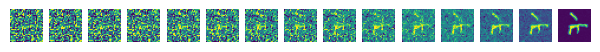

Epoch 12 | Step 100 | Loss: 0.03462492302060127 | C: 3


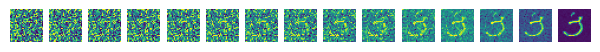

Epoch 12 | Step 200 | Loss: 0.037605009973049164 | C: 4


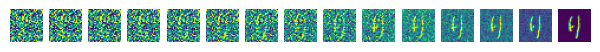

Epoch 12 | Step 300 | Loss: 0.039372045546770096 | C: 5


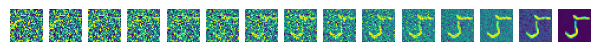

Epoch 12 | Step 400 | Loss: 0.0316968597471714 | C: 6


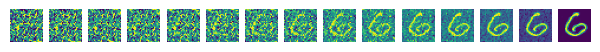

Epoch 12 | Step 500 | Loss: 0.03453315794467926 | C: 7


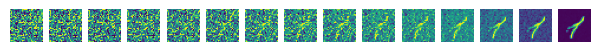

Epoch 13 | Step 000 | Loss: 0.037939880043268204 | C: 8


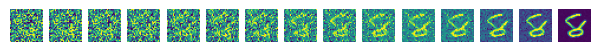

Epoch 13 | Step 100 | Loss: 0.03232827037572861 | C: 9


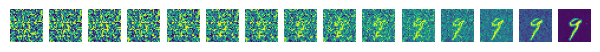

Epoch 13 | Step 200 | Loss: 0.03226970136165619 | C: 0


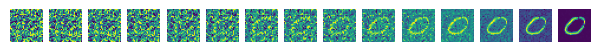

Epoch 13 | Step 300 | Loss: 0.03449970856308937 | C: 1


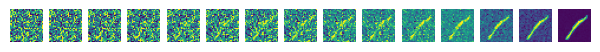

Epoch 13 | Step 400 | Loss: 0.03893592953681946 | C: 2


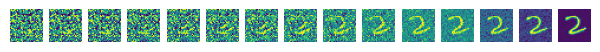

Epoch 13 | Step 500 | Loss: 0.03243272751569748 | C: 3


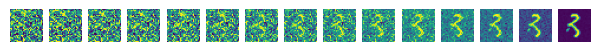

Epoch 14 | Step 000 | Loss: 0.033156368881464005 | C: 4


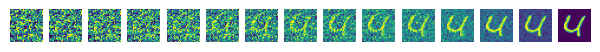

Epoch 14 | Step 100 | Loss: 0.03342633694410324 | C: 5


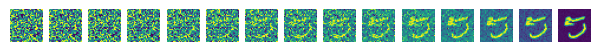

Epoch 14 | Step 200 | Loss: 0.038665443658828735 | C: 6


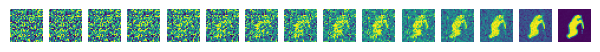

Epoch 14 | Step 300 | Loss: 0.03287402167916298 | C: 7


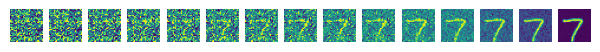

Epoch 14 | Step 400 | Loss: 0.03106681816279888 | C: 8


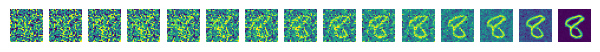

Epoch 14 | Step 500 | Loss: 0.036851149052381516 | C: 9


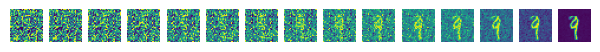

Epoch 15 | Step 000 | Loss: 0.03619501367211342 | C: 0


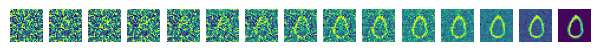

Epoch 15 | Step 100 | Loss: 0.034315720200538635 | C: 1


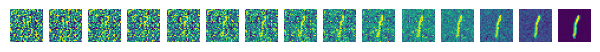

Epoch 15 | Step 200 | Loss: 0.029678836464881897 | C: 2


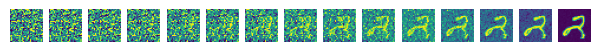

Epoch 15 | Step 300 | Loss: 0.03145374357700348 | C: 3


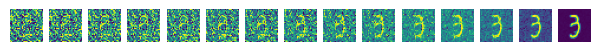

Epoch 15 | Step 400 | Loss: 0.03556197136640549 | C: 4


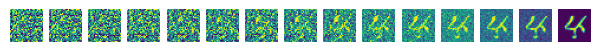

Epoch 15 | Step 500 | Loss: 0.03361908346414566 | C: 5


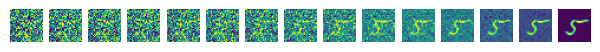

Epoch 16 | Step 000 | Loss: 0.03388179838657379 | C: 6


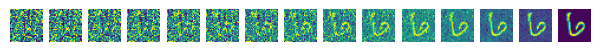

Epoch 16 | Step 100 | Loss: 0.032345108687877655 | C: 7


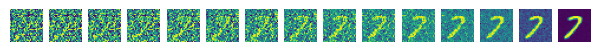

Epoch 16 | Step 200 | Loss: 0.03771423548460007 | C: 8


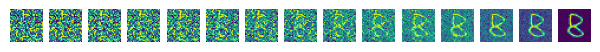

Epoch 16 | Step 300 | Loss: 0.03149722144007683 | C: 9


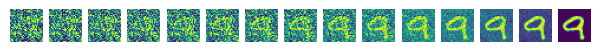

Epoch 16 | Step 400 | Loss: 0.0368381030857563 | C: 0


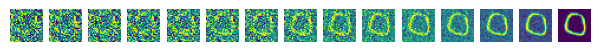

Epoch 16 | Step 500 | Loss: 0.037316955626010895 | C: 1


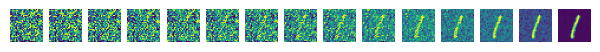

Epoch 17 | Step 000 | Loss: 0.03172679245471954 | C: 2


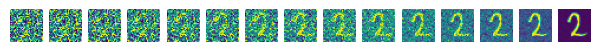

Epoch 17 | Step 100 | Loss: 0.031627193093299866 | C: 3


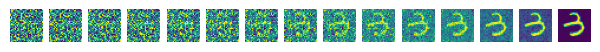

Epoch 17 | Step 200 | Loss: 0.03635070100426674 | C: 4


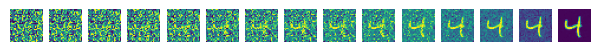

Epoch 17 | Step 300 | Loss: 0.03306720033288002 | C: 5


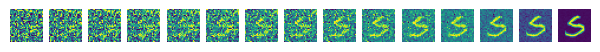

Epoch 17 | Step 400 | Loss: 0.029885906726121902 | C: 6


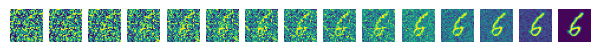

Epoch 17 | Step 500 | Loss: 0.030690213665366173 | C: 7


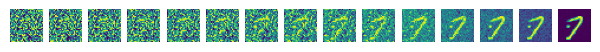

Epoch 18 | Step 000 | Loss: 0.030061746016144753 | C: 8


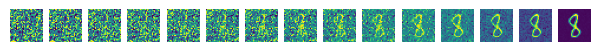

Epoch 18 | Step 100 | Loss: 0.03653864189982414 | C: 9


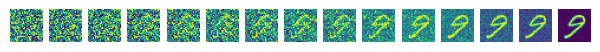

Epoch 18 | Step 200 | Loss: 0.03161006048321724 | C: 0


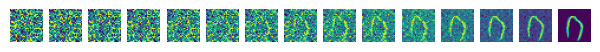

Epoch 18 | Step 300 | Loss: 0.03780514746904373 | C: 1


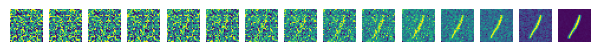

Epoch 18 | Step 400 | Loss: 0.03586987406015396 | C: 2


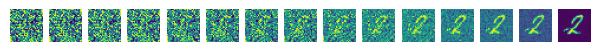

Epoch 18 | Step 500 | Loss: 0.027695970609784126 | C: 3


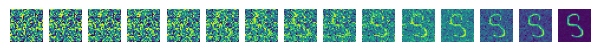

Epoch 19 | Step 000 | Loss: 0.031297147274017334 | C: 4


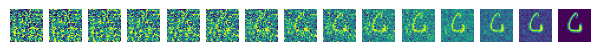

Epoch 19 | Step 100 | Loss: 0.032561108469963074 | C: 5


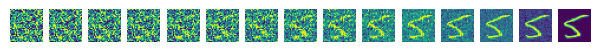

Epoch 19 | Step 200 | Loss: 0.03038148023188114 | C: 6


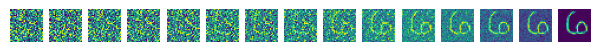

Epoch 19 | Step 300 | Loss: 0.033469025045633316 | C: 7


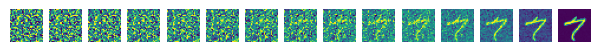

Epoch 19 | Step 400 | Loss: 0.028067993000149727 | C: 8


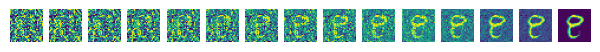

Epoch 19 | Step 500 | Loss: 0.035393476486206055 | C: 9


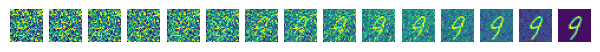

Epoch 20 | Step 000 | Loss: 0.03545896336436272 | C: 0


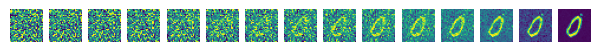

Epoch 20 | Step 100 | Loss: 0.03673500940203667 | C: 1


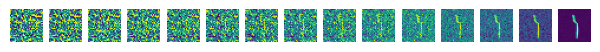

Epoch 20 | Step 200 | Loss: 0.03438238799571991 | C: 2


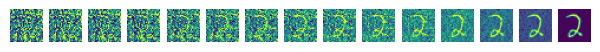

Epoch 20 | Step 300 | Loss: 0.028542710468173027 | C: 3


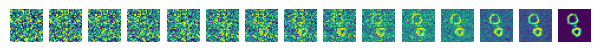

Epoch 20 | Step 400 | Loss: 0.02574644237756729 | C: 4


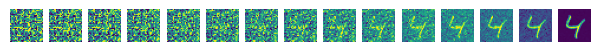

Epoch 20 | Step 500 | Loss: 0.034922920167446136 | C: 5


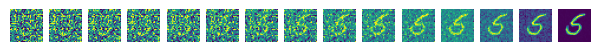

Epoch 21 | Step 000 | Loss: 0.03242441639304161 | C: 6


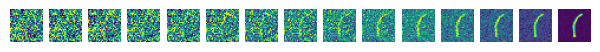

Epoch 21 | Step 100 | Loss: 0.034287042915821075 | C: 7


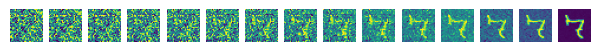

Epoch 21 | Step 200 | Loss: 0.0295307207852602 | C: 8


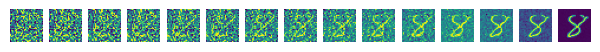

Epoch 21 | Step 300 | Loss: 0.035097695887088776 | C: 9


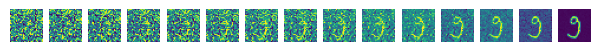

Epoch 21 | Step 400 | Loss: 0.04077325016260147 | C: 0


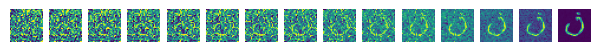

Epoch 21 | Step 500 | Loss: 0.02904605306684971 | C: 1


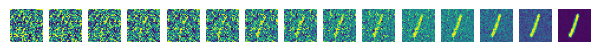

Epoch 22 | Step 000 | Loss: 0.03457874432206154 | C: 2


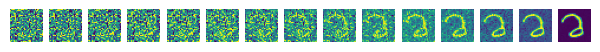

Epoch 22 | Step 100 | Loss: 0.03275958448648453 | C: 3


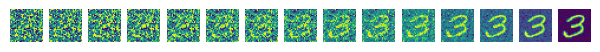

Epoch 22 | Step 200 | Loss: 0.031676534563302994 | C: 4


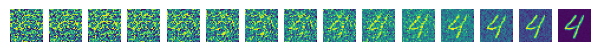

Epoch 22 | Step 300 | Loss: 0.031274475157260895 | C: 5


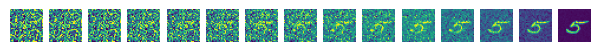

Epoch 22 | Step 400 | Loss: 0.03204607591032982 | C: 6


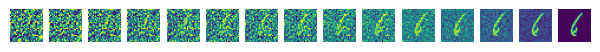

Epoch 22 | Step 500 | Loss: 0.03159824758768082 | C: 7


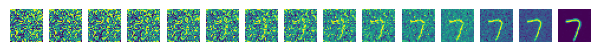

Epoch 23 | Step 000 | Loss: 0.03260553628206253 | C: 8


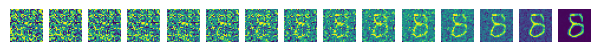

Epoch 23 | Step 100 | Loss: 0.030354050919413567 | C: 9


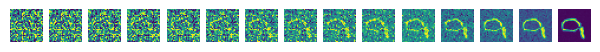

Epoch 23 | Step 200 | Loss: 0.032280080020427704 | C: 0


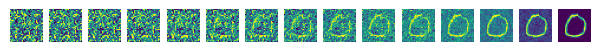

Epoch 23 | Step 300 | Loss: 0.035569511353969574 | C: 1


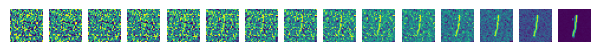

Epoch 23 | Step 400 | Loss: 0.038863539695739746 | C: 2


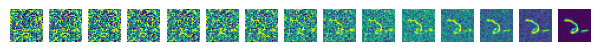

Epoch 23 | Step 500 | Loss: 0.03707312420010567 | C: 3


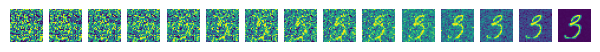

Epoch 24 | Step 000 | Loss: 0.03280314803123474 | C: 4


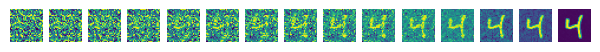

Epoch 24 | Step 100 | Loss: 0.03395353630185127 | C: 5


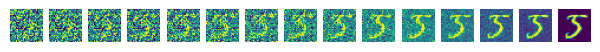

Epoch 24 | Step 200 | Loss: 0.03618907928466797 | C: 6


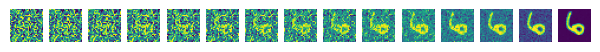

Epoch 24 | Step 300 | Loss: 0.036690350621938705 | C: 7


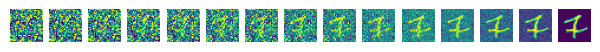

Epoch 24 | Step 400 | Loss: 0.03034846857190132 | C: 8


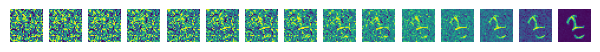

Epoch 24 | Step 500 | Loss: 0.02944166772067547 | C: 9


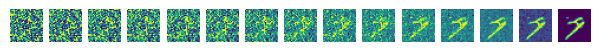

Epoch 25 | Step 000 | Loss: 0.03194652870297432 | C: 0


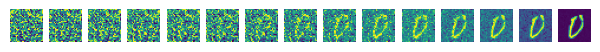

Epoch 25 | Step 100 | Loss: 0.034882839769124985 | C: 1


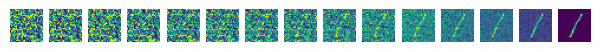

Epoch 25 | Step 200 | Loss: 0.035256002098321915 | C: 2


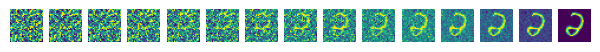

Epoch 25 | Step 300 | Loss: 0.03773432597517967 | C: 3


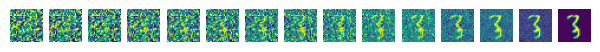

Epoch 25 | Step 400 | Loss: 0.03987329825758934 | C: 4


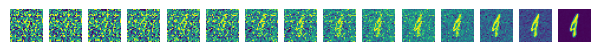

Epoch 25 | Step 500 | Loss: 0.0303842481225729 | C: 5


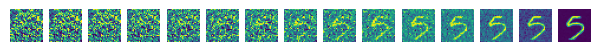

Epoch 26 | Step 000 | Loss: 0.030740197747945786 | C: 6


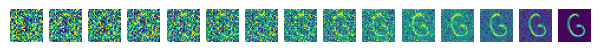

Epoch 26 | Step 100 | Loss: 0.033241286873817444 | C: 7


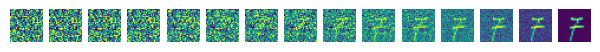

Epoch 26 | Step 200 | Loss: 0.03312021493911743 | C: 8


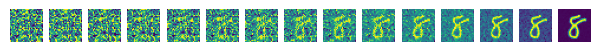

Epoch 26 | Step 300 | Loss: 0.028285503387451172 | C: 9


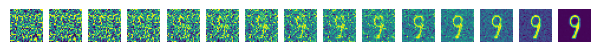

Epoch 26 | Step 400 | Loss: 0.03576246649026871 | C: 0


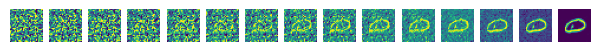

Epoch 26 | Step 500 | Loss: 0.029439501464366913 | C: 1


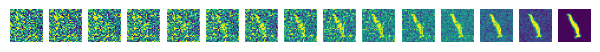

Epoch 27 | Step 000 | Loss: 0.029182493686676025 | C: 2


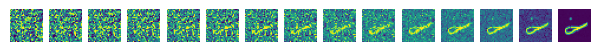

Epoch 27 | Step 100 | Loss: 0.03558056056499481 | C: 3


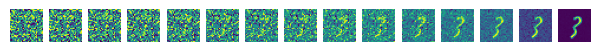

Epoch 27 | Step 200 | Loss: 0.0348372682929039 | C: 4


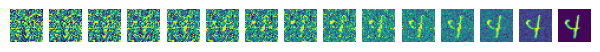

Epoch 27 | Step 300 | Loss: 0.03183151036500931 | C: 5


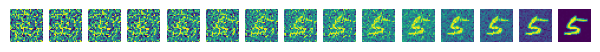

Epoch 27 | Step 400 | Loss: 0.035907138139009476 | C: 6


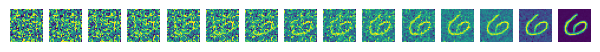

Epoch 27 | Step 500 | Loss: 0.029535338282585144 | C: 7


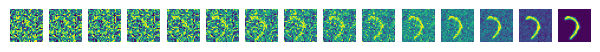

Epoch 28 | Step 000 | Loss: 0.02654988318681717 | C: 8


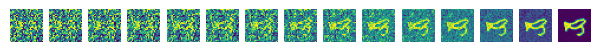

Epoch 28 | Step 100 | Loss: 0.032915886491537094 | C: 9


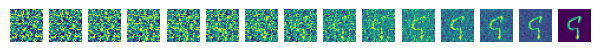

Epoch 28 | Step 200 | Loss: 0.03049718588590622 | C: 0


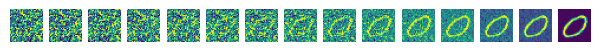

Epoch 28 | Step 300 | Loss: 0.03158014267683029 | C: 1


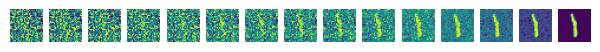

Epoch 28 | Step 400 | Loss: 0.03425765782594681 | C: 2


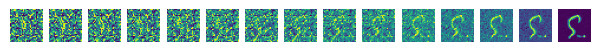

Epoch 28 | Step 500 | Loss: 0.034182071685791016 | C: 3


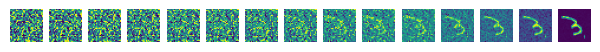

Epoch 29 | Step 000 | Loss: 0.03274569660425186 | C: 4


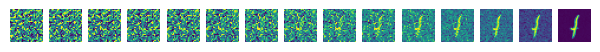

Epoch 29 | Step 100 | Loss: 0.03389306738972664 | C: 5


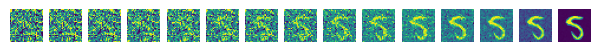

Epoch 29 | Step 200 | Loss: 0.03291243687272072 | C: 6


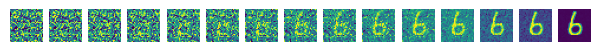

Epoch 29 | Step 300 | Loss: 0.031061487272381783 | C: 7


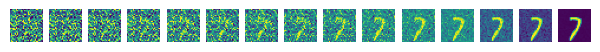

Epoch 29 | Step 400 | Loss: 0.033514171838760376 | C: 8


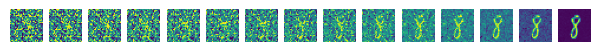

Epoch 29 | Step 500 | Loss: 0.03327321633696556 | C: 9


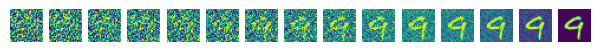

In [19]:
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 30
preview_c = 0

model.train()
for epoch in range(epochs):
    for step, batch in enumerate(dataloader):
        c_drop_prob = 0.1
        optimizer.zero_grad()

        t = torch.randint(0, T, (BATCH_SIZE,), device=device).float()
        x = batch[0].to(device)
        c_hot, c_mask = get_context_mask(batch[1], c_drop_prob)  # New
        loss = ddpm.get_loss(model, x, t, c_hot, c_mask)
        loss.backward()
        optimizer.step()

        if epoch % 1 == 0 and step % 100 == 0:
            print(f"Epoch {epoch} | Step {step:03d} | Loss: {loss.item()} | C: {preview_c}")
            c_drop_prob = 0 # Do not drop context for preview
            c_hot, c_mask = get_context_mask(torch.Tensor([preview_c]), c_drop_prob)
            ddpm.sample_images(model, IMG_CH, IMG_SIZE, ncols, c_hot, c_mask)
            preview_c = (preview_c + 1) % N_CLASSES

In [20]:
def save_model(model, filepath):
    """
    儲存模型權重到指定的檔案路徑。
    
    :param model: 要儲存的模型
    :param filepath: 儲存檔案的路徑
    """
    torch.save(model.state_dict(), filepath)
    print(f"模型權重已儲存到 {filepath}")

# 使用範例
save_model(model, "C:/cvpdl/hw3/model_weights2.pth")

模型權重已儲存到 C:/cvpdl/hw3/model_weights2.pth


# fid

In [ ]:
import os
import torch
from torchvision import transforms

# 載入模型結構
weights_path = "C:/cvpdl/hw3/model_weights2.pth"
model.load_state_dict(torch.load(weights_path))
model.eval()

# 目標資料夾
save_dir = "C:/cvpdl/hw3/g3"
os.makedirs(save_dir, exist_ok=True)

total_per_class = 5000  # 每個數字類別生成1000張
num_classes = 2        # 0~9
counter = 1             # 用來控制檔名從00001.png開始

with torch.no_grad():
    for c in range(num_classes):
        print(f"Generating class {c} ...")

        # one-hot context
        c_drop_prob = 0.0  # 這裡可以視情況調整
        c_hot, c_mask = get_context_mask(torch.Tensor([c]), c_drop_prob)

        for idx in range(total_per_class):
            # 初始隨機噪聲影像
            x_t = torch.randn((1, 1, 28, 28), device=device)
            
            # 反向diffusion從T到0
            for i in range(ddpm.T - 1, -1, -1):
                t = torch.full((1,), i, device=device).float()
                e_t = model(x_t, t, c_hot, c_mask)
                x_t = ddpm.reverse_q(x_t, t, e_t)
            
            # t=0 時轉成影像並儲存
            img = x_t.detach().cpu().squeeze(0).squeeze(0)
            img = torch.clamp(img, 0, 1)

            # 灰階轉 RGB 三通道
            img_rgb = img.repeat(3, 1, 1)

            # 轉成 PIL 影像
            img_pil = transforms.ToPILImage()(img_rgb)

            # 儲存，檔名 00001.png ~ 10000.png
            filename = f"{counter:05d}.png"
            img_pil.save(os.path.join(save_dir, filename))

            counter += 1

print("✅ 影像生成完成，共 10000 張！")


Generating class 0 ...
Generating class 1 ...
Generating class 2 ...
Generating class 3 ...
Generating class 4 ...
Generating class 5 ...
Generating class 6 ...
Generating class 7 ...
Generating class 8 ...
Generating class 9 ...
✅ 影像生成完成，共 10000 張！


In [27]:
# for testing
with torch.no_grad():
    for c in range(1):
        print(c)
        c_drop_prob = 0 # Change me to a value between 1 and 0
        c_hot, c_mask = get_context_mask(torch.Tensor([c]), c_drop_prob)
        x_t = torch.randn((1, 1, 28, 28), device=device)
        hidden_rows = ddpm.T / ncols
        plot_number = 1

        # Go from T to 0 removing and adding noise until t = 0
        for i in range(0, ddpm.T)[::-1]:
            t = torch.full((1,), i, device=device).float()
            e_t = model(x_t, t, c_hot, c_mask)  # Predicted noise
            x_t = ddpm.reverse_q(x_t, t, e_t)
            # transfer final image to RGB and save to directory 
            if i == 0:
                img = x_t.detach().cpu().squeeze(0).squeeze(0)
                img = torch.clamp(img, 0, 1)
                img_pil = transforms.ToPILImage()(img)
                os.makedirs("C:/cvpdl/hw3/g", exist_ok=True)
                img_pil.save(f"C:/cvpdl/hw3/g/1.png")


0


In [23]:
# !pip install torch-fidelity

In [29]:
import torch_fidelity

metrics = torch_fidelity.calculate_metrics(
    input1='C:/cvpdl/hw3/data/minst24',   # 真實圖片資料夾60000張
    input2='C:/cvpdl/hw3/g2',   # 生成圖片資料夾10000張
    cuda=True,
    isc=False,  # 是否同時計算 Inception Score
    fid=True,    # 是否計算 FID
    # sample_size=1000,
)

print("FID:", metrics['frechet_inception_distance'])

Creating feature extractor "inception-v3-compat" with features ['2048']
Extracting statistics from input 1
Looking for samples non-recursivelty in "C:/cvpdl/hw3/data/minst24" with extensions png,jpg,jpeg
Found 60000 samples
Processing samples                                                             
Extracting statistics from input 2
Looking for samples non-recursivelty in "C:/cvpdl/hw3/g2" with extensions png,jpg,jpeg
Found 10000 samples
Processing samples                                                            


FID: 25.851000494839752


Frechet Inception Distance: 25.851000494839752


# visualize

<Figure size 1000x1000 with 0 Axes>

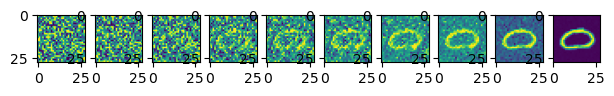

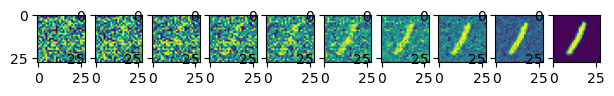

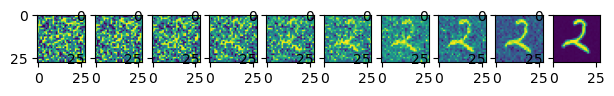

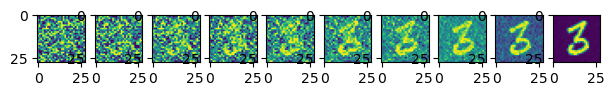

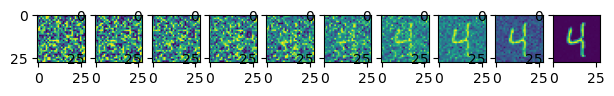

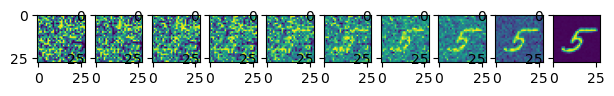

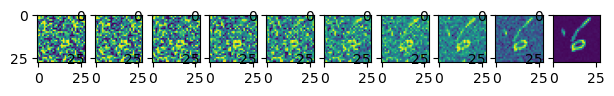

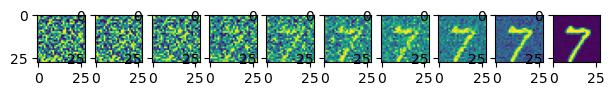

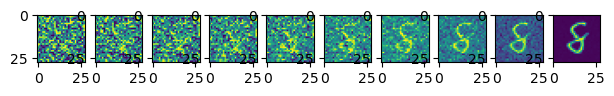

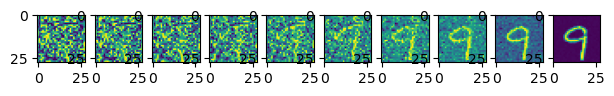

In [38]:
plt.figure(figsize=(10,10))
ncols = 10
c_drop_prob = 0 # Change me to a value between 1 and 0

for c in range(10):
    # print(c)
    c_hot, c_mask = get_context_mask(torch.Tensor([c]), c_drop_prob)
    ddpm.sample_images(model, IMG_CH, IMG_SIZE, ncols, c_hot, c_mask, axis_on=True)

In [1]:
!pip freeze > requirements.txt